In [1]:
from datasets.load import load_images
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pickle

%matplotlib inline
plt.rcParams['figure.figsize'] = (15., 12.) # set default size of plots
#plt.rcParams['image.interpolation'] = 'nearest'
#plt.rcParams['image.cmap'] = 'gray'

# for auto-reloading extenrnal modules
%load_ext autoreload
%autoreload 2

In [2]:
plt.rcParams['figure.figsize'] = (15., 12.) # set default size of plots


In [3]:
samples = load_images('train', 'datasets')

[{'name': 'waldo', 'bounds': [{'x1': 2140, 'y1': 1376, 'x2': 2270, 'y2': 1656}]}, {'name': 'wenda', 'bounds': [{'x1': 4567, 'y1': 3815, 'x2': 4644, 'y2': 4055}]}, {'name': 'wizard', 'bounds': [{'x1': 2454, 'y1': 725, 'x2': 2594, 'y2': 985}]}]


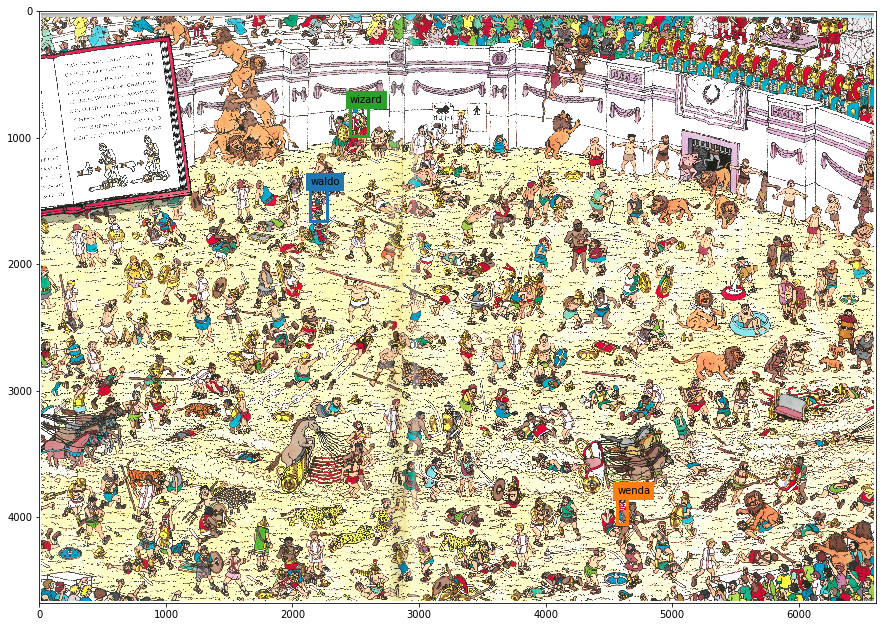

[{'name': 'waldo', 'bounds': [{'x1': 964, 'y1': 799, 'x2': 1356, 'y2': 1199}]}]


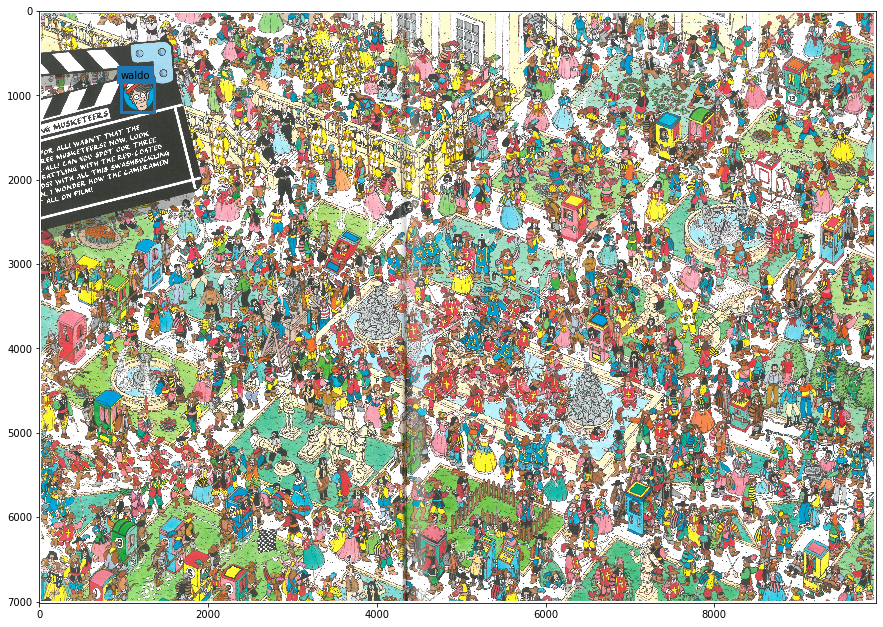

[{'name': 'waldo', 'bounds': [{'x1': 490, 'y1': 390, 'x2': 529, 'y2': 435}, {'x1': 397, 'y1': 91, 'x2': 465, 'y2': 170}]}, {'name': 'wenda', 'bounds': [{'x1': 1575, 'y1': 758, 'x2': 1596, 'y2': 808}]}]


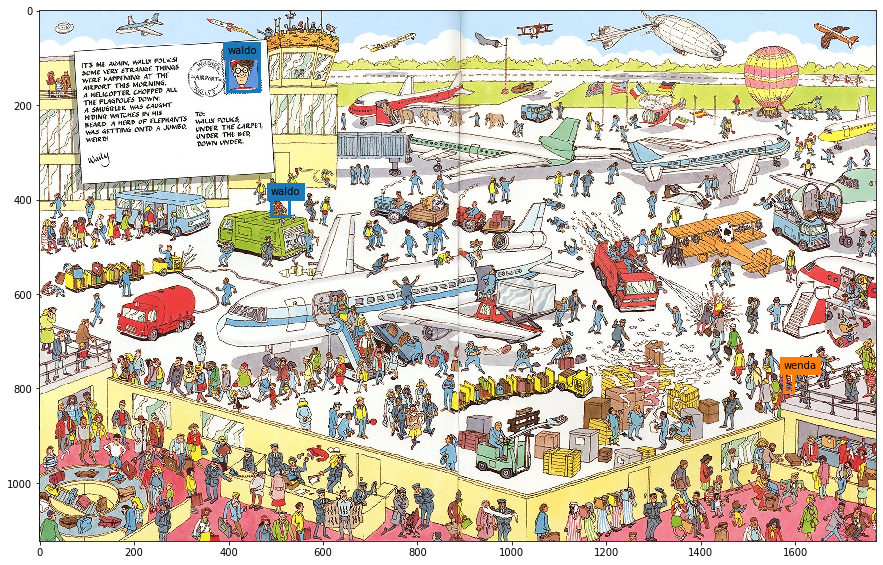

[{'name': 'wizard', 'bounds': [{'x1': 4300, 'y1': 1672, 'x2': 4397, 'y2': 2049}]}, {'name': 'wenda', 'bounds': [{'x1': 4884, 'y1': 208, 'x2': 4959, 'y2': 513}]}, {'name': 'waldo', 'bounds': [{'x1': 6140, 'y1': 1954, 'x2': 6228, 'y2': 2294}, {'x1': 1164, 'y1': 633, 'x2': 1339, 'y2': 833}]}]


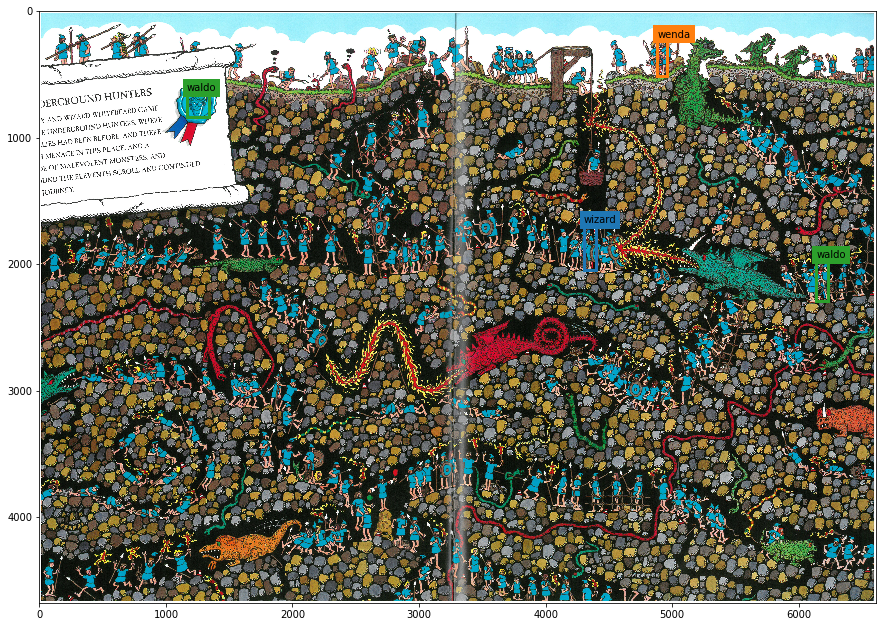

[{'name': 'waldo', 'bounds': [{'x1': 8495, 'y1': 5691, 'x2': 8702, 'y2': 6099}, {'x1': 733, 'y1': 461, 'x2': 1172, 'y2': 961}]}]


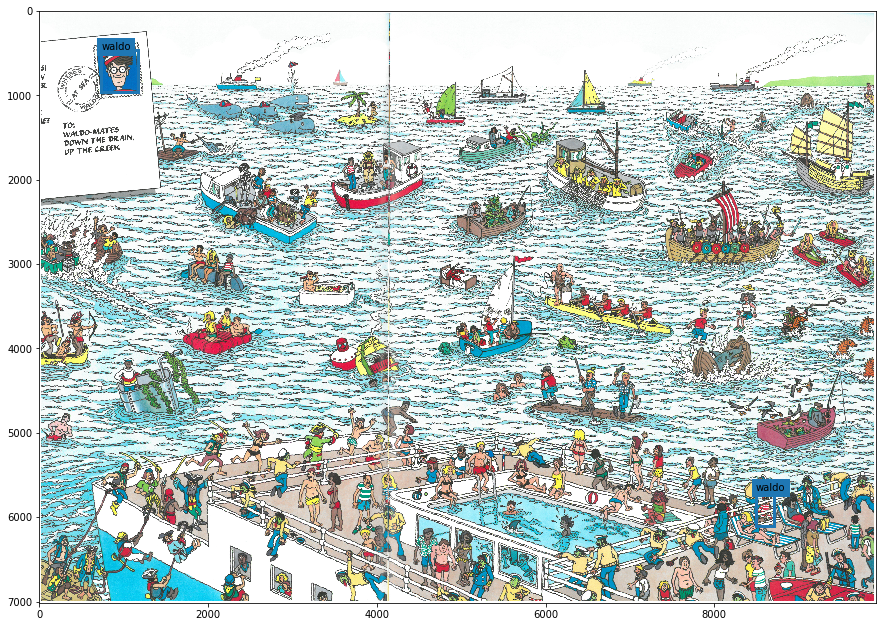

In [4]:
def draw_bbox(ax, name, box, col='r'):
    r = patches.Rectangle((box['x1'], box['y1']), 
                          box['x2'] - box['x1'],
                          box['y2'] - box['y1'],
                          linewidth=3,
                          edgecolor=col,
                          facecolor='none')
    ax.add_patch(r)
    ax.text(box['x1'], box['y1'], name,
            bbox={'facecolor': col, 'linewidth': 0})

def draw_annotation(ax, classes):
    colors = plt.get_cmap('tab10')
    for idx, cl in enumerate(classes):
        col = colors(idx)
        for box in cl['bounds']:
            draw_bbox(ax, cl['name'], box, col)

for sample in np.random.choice(samples, 5, replace=False):
    fig, ax = plt.subplots(1)
    ax.imshow(sample['img'])
    print(sample['classes'])
    draw_annotation(ax, sample['classes'])
    plt.show()

In [5]:
import math
def generate_pos_samples(samples, blowup=2):
    res = []
    for sample in samples:
        for cl in sample['classes']:
            for box in cl['bounds']:
                scales = np.random.uniform(low=7, high=7, size=(blowup,))
                for s in scales:
                    try:
                        ymin, ymax = box['y1'], box['y2']
                        xmin, xmax = box['x1'], box['x2']
                        sx = math.ceil((ymax - ymin)*s/2)
                        sy = math.ceil((xmax - xmin)*s/2)
                        ymin, ymax = ymin - sy, ymax + sy
                        xmin, xmax = xmin - sy, xmax + sy
                        
                        img = sample['img'][ymin:ymax, xmin:xmax]
                        if img.size != 0:
                            #print(img)
                            res.append(dict(
                                name = cl['name'],
                                img = img,
                                scale = 1/s,
                                bbox = {'x1': box['x1'] - xmin,
                                        'y1': box['y1'] - ymin,
                                        'x2': box['x2'] - xmin,
                                        'y2': box['y2'] - ymin}                           
                            ))
                    except Exception as e:
                        print(e)
    #np.random.shuffle(res)
    return res

pos_samples = generate_pos_samples(samples, 1)

num samples: 62
num scaled samples: 122


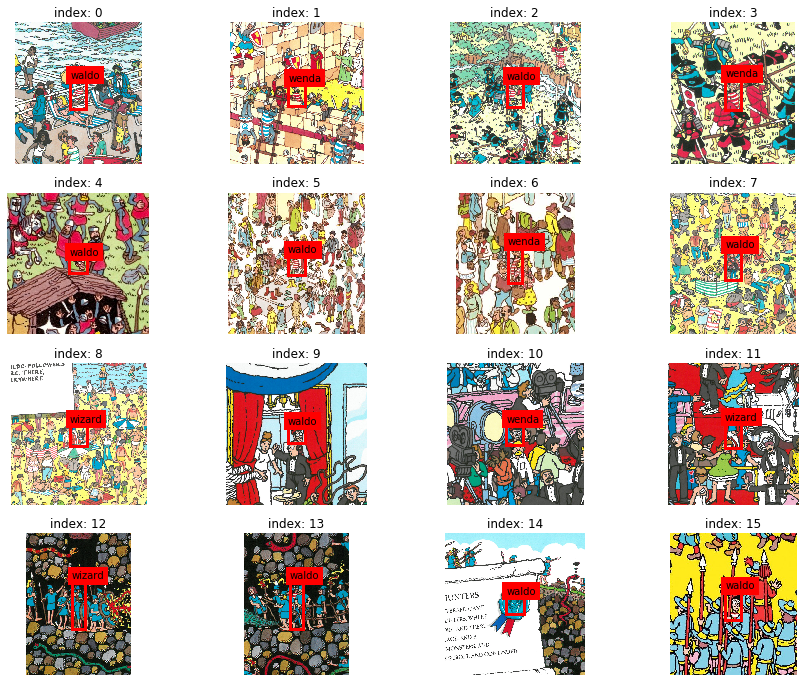

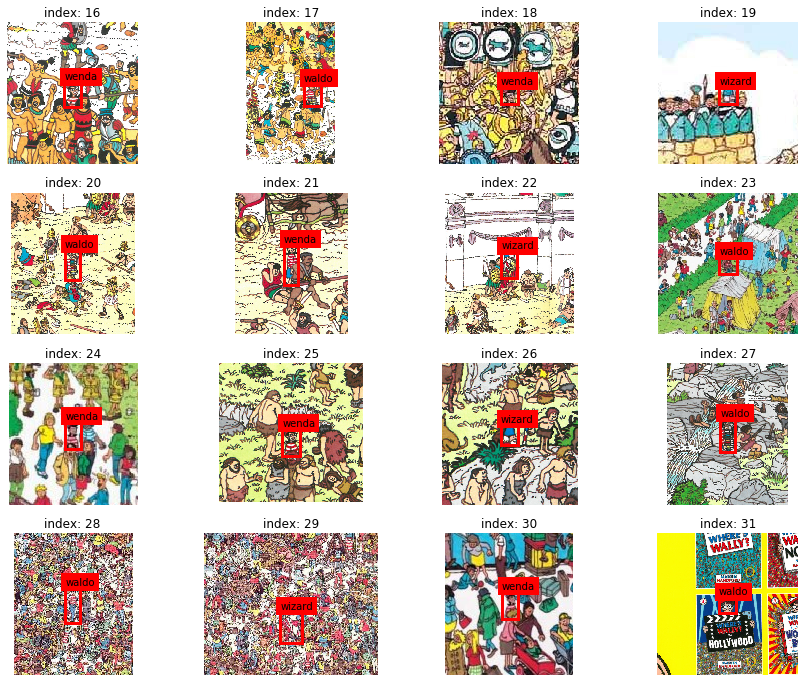

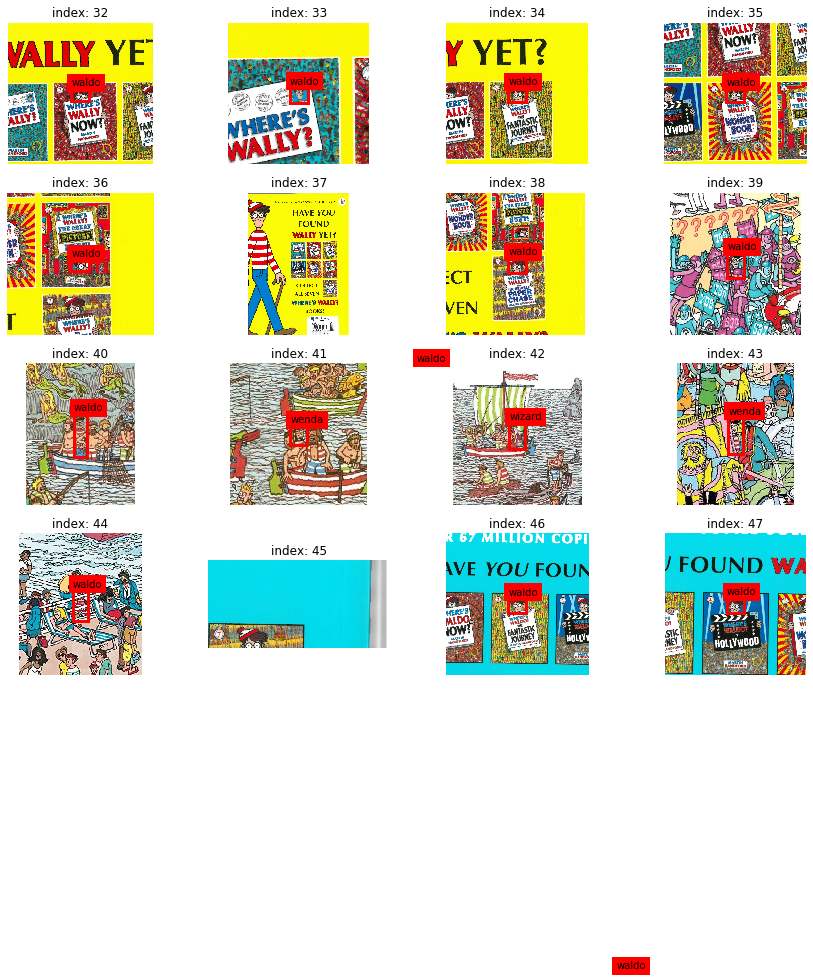

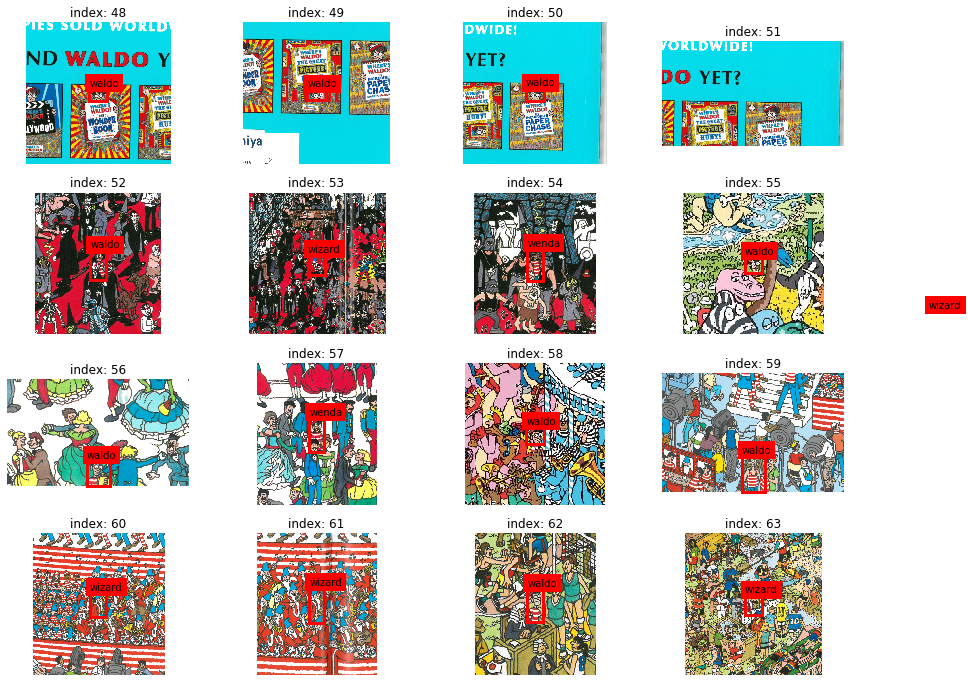

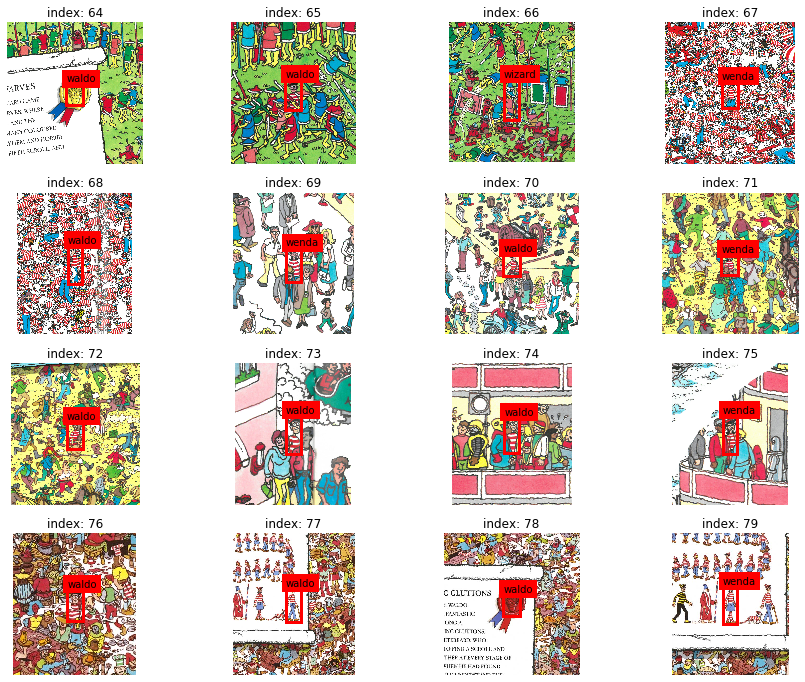

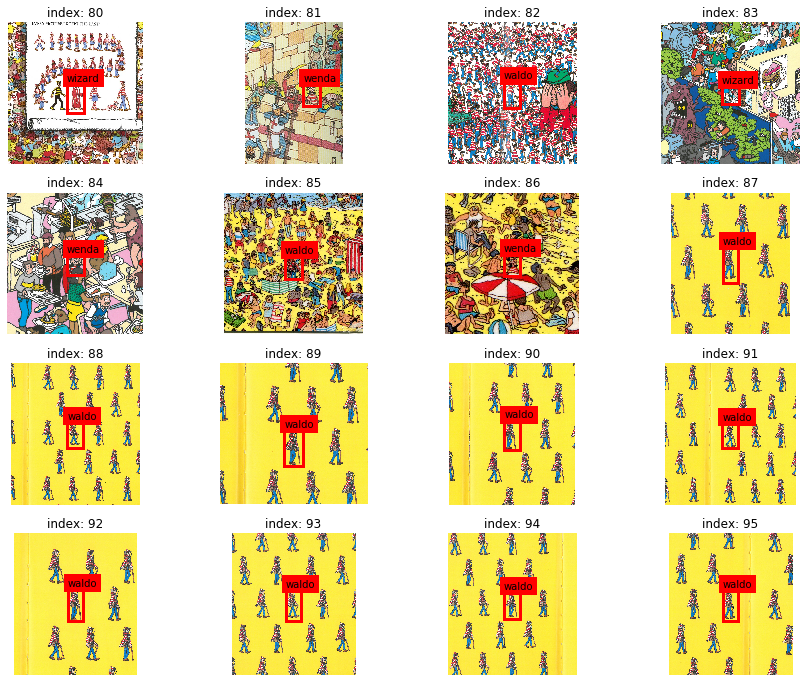

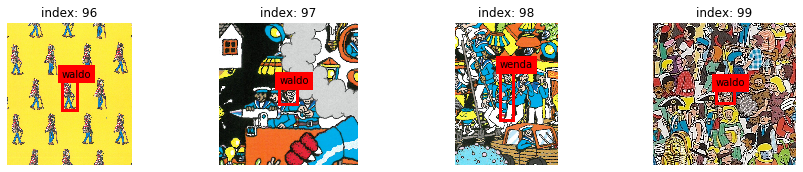

In [6]:
print('num samples: {}'.format(len(samples)))
print('num scaled samples: {}'.format(len(pos_samples)))


for idx, sample in enumerate(pos_samples[:100]):
    if idx != 0 and idx % 16 == 0:
        plt.show()
    ax = plt.subplot(4,4,(idx % 16)+1)
    plt.title('index: {}'.format(idx))
    ax.imshow(sample['img'])
    plt.axis('off')
    draw_bbox(ax, sample['name'], sample['bbox'])
    
plt.show()

In [12]:
## save first image sample
for idx in [26, 61, 25, 70]:
    with open('cache/waldo{}.pkl'.format(idx), 'wb') as f:
        pickle.dump(pos_samples[idx], f)